## Load Libraries

In [1]:
import pandas as pd 
import numpy as np 
import plotly.express as px 
import plotly.graph_objects as go 
import plotly.figure_factory as ff
import seaborn as sns

## Load Data

In [2]:
df = pd.read_csv("loan_data.csv")
df

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status
0,22.0,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,1
1,21.0,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,0
2,25.0,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,1
3,23.0,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,1
4,24.0,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44995,27.0,male,Associate,47971.0,6,RENT,15000.0,MEDICAL,15.66,0.31,3.0,645,No,1
44996,37.0,female,Associate,65800.0,17,RENT,9000.0,HOMEIMPROVEMENT,14.07,0.14,11.0,621,No,1
44997,33.0,male,Associate,56942.0,7,RENT,2771.0,DEBTCONSOLIDATION,10.02,0.05,10.0,668,No,1
44998,29.0,male,Bachelor,33164.0,4,RENT,12000.0,EDUCATION,13.23,0.36,6.0,604,No,1


## Data_Overview

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45000 entries, 0 to 44999
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   person_age                      45000 non-null  float64
 1   person_gender                   45000 non-null  object 
 2   person_education                45000 non-null  object 
 3   person_income                   45000 non-null  float64
 4   person_emp_exp                  45000 non-null  int64  
 5   person_home_ownership           45000 non-null  object 
 6   loan_amnt                       45000 non-null  float64
 7   loan_intent                     45000 non-null  object 
 8   loan_int_rate                   45000 non-null  float64
 9   loan_percent_income             45000 non-null  float64
 10  cb_person_cred_hist_length      45000 non-null  float64
 11  credit_score                    45000 non-null  int64  
 12  previous_loan_defaults_on_file  

In [5]:
df.head()

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status
0,22.0,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,1
1,21.0,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,0
2,25.0,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,1
3,23.0,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,1
4,24.0,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,1


In [6]:
df.tail()

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status
44995,27.0,male,Associate,47971.0,6,RENT,15000.0,MEDICAL,15.66,0.31,3.0,645,No,1
44996,37.0,female,Associate,65800.0,17,RENT,9000.0,HOMEIMPROVEMENT,14.07,0.14,11.0,621,No,1
44997,33.0,male,Associate,56942.0,7,RENT,2771.0,DEBTCONSOLIDATION,10.02,0.05,10.0,668,No,1
44998,29.0,male,Bachelor,33164.0,4,RENT,12000.0,EDUCATION,13.23,0.36,6.0,604,No,1
44999,24.0,male,High School,51609.0,1,RENT,6665.0,DEBTCONSOLIDATION,17.05,0.13,3.0,628,No,1


In [7]:
df.isnull().sum()

person_age                        0
person_gender                     0
person_education                  0
person_income                     0
person_emp_exp                    0
person_home_ownership             0
loan_amnt                         0
loan_intent                       0
loan_int_rate                     0
loan_percent_income               0
cb_person_cred_hist_length        0
credit_score                      0
previous_loan_defaults_on_file    0
loan_status                       0
dtype: int64

In [8]:
#Describtion for all object Features
df.select_dtypes('O').describe()  

,person_gender,person_education,person_home_ownership,loan_intent,previous_loan_defaults_on_file
count,45000,45000,45000,45000,45000
unique,2,5,4,6,2
top,male,Bachelor,RENT,EDUCATION,Yes
freq,24841,13399,23443,9153,22858


In [4]:
#Describtion for all Numbers Features
df.select_dtypes('number').describe()

,person_age,person_income,person_emp_exp,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,loan_status
count,45000.000000,4.500000e+04,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000
mean,27.764178,8.031905e+04,5.410333,9583.157556,11.006606,0.139725,5.867489,632.608756,0.222222
std,6.045108,8.042250e+04,6.063532,6314.886691,2.978808,0.087212,3.879702,50.435865,0.415744
min,20.000000,8.000000e+03,0.000000,500.000000,5.420000,0.000000,2.000000,390.000000,0.000000
25%,24.000000,4.720400e+04,1.000000,5000.000000,8.590000,0.070000,3.000000,601.000000,0.000000
50%,26.000000,6.704800e+04,4.000000,8000.000000,11.010000,0.120000,4.000000,640.000000,0.000000
75%,30.000000,9.578925e+04,8.000000,12237.250000,12.990000,0.190000,8.000000,670.000000,0.000000
max,144.000000,7.200766e+06,125.000000,35000.000000,20.000000,0.660000,30.000000,850.000000,1.000000


In [9]:
#Detect if There Are duplicates 
df.duplicated().sum()

0

## EDA Univariate Analysis

In [10]:
df["person_age"]

0        22.0
1        21.0
2        25.0
3        23.0
4        24.0
         ... 
44995    27.0
44996    37.0
44997    33.0
44998    29.0
44999    24.0
Name: person_age, Length: 45000, dtype: float64

In [11]:
df['person_age'] = df['person_age'].astype(int)

In [12]:
df

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status
0,22,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,1
1,21,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,0
2,25,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,1
3,23,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,1
4,24,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44995,27,male,Associate,47971.0,6,RENT,15000.0,MEDICAL,15.66,0.31,3.0,645,No,1
44996,37,female,Associate,65800.0,17,RENT,9000.0,HOMEIMPROVEMENT,14.07,0.14,11.0,621,No,1
44997,33,male,Associate,56942.0,7,RENT,2771.0,DEBTCONSOLIDATION,10.02,0.05,10.0,668,No,1
44998,29,male,Bachelor,33164.0,4,RENT,12000.0,EDUCATION,13.23,0.36,6.0,604,No,1


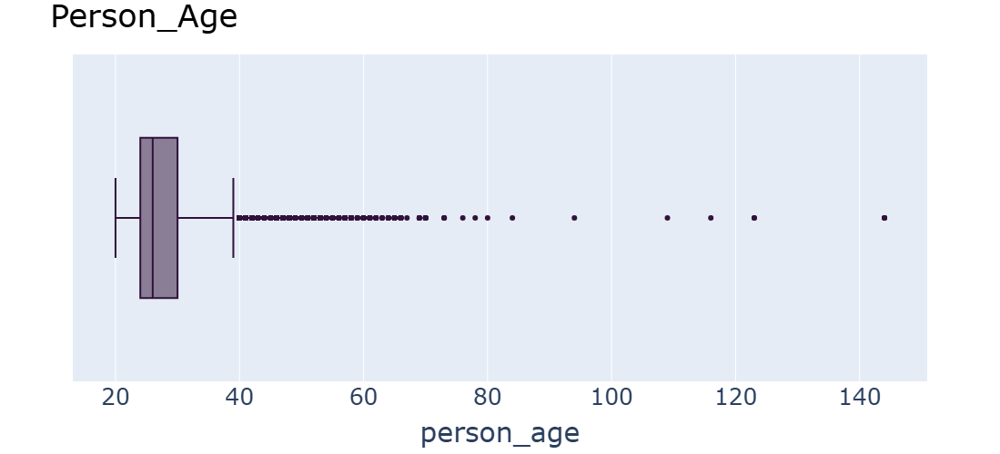

In [13]:
#Box plot to Detect outliers
fig=px.box(data_frame=df , x = 'person_age',color_discrete_sequence=px.colors.sequential.Turbo)
fig.update_layout(title="Person_Age",height=500, width=900,font=dict(size=25),
        title_font_color='black')
fig.show()

In [5]:
df = df[df["person_age"] <= 70]

In [6]:
#reset index again
df.reset_index(inplace = True , drop = True )

In [7]:
df["person_gender"].describe()

count     44985
unique        2
top        male
freq      24830
Name: person_gender, dtype: object

In [8]:
df["person_gender"].unique()

array(['female', 'male'], dtype=object)

In [9]:
#Count for Each Category to plot Visual
df_sorted=df['person_gender'].value_counts().reset_index()
df_sorted

,person_gender,count
0,male,24830
1,female,20155


In [10]:
#Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

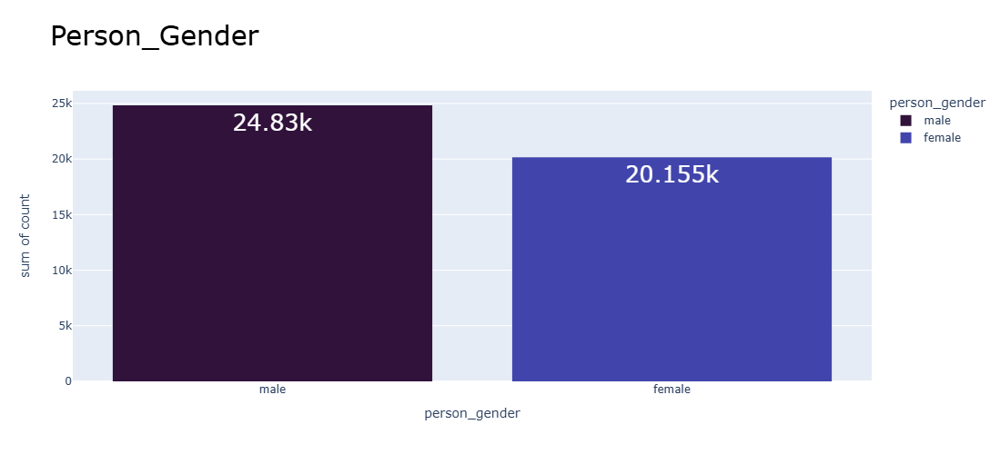

In [21]:
#Histogram that appears count for each Gender
fig=px.histogram(data_frame=df_sorted , x= 'person_gender',y='count',color='person_gender',color_discrete_sequence=px.colors.sequential.Turbo,
                 title= 'Person_Gender',text_auto=True,width=900,height=500)
fig.update_traces(textfont_size=25,textfont_color='white')
fig.update_layout(title_font=dict(size=30, color='black')) 
fig.show()

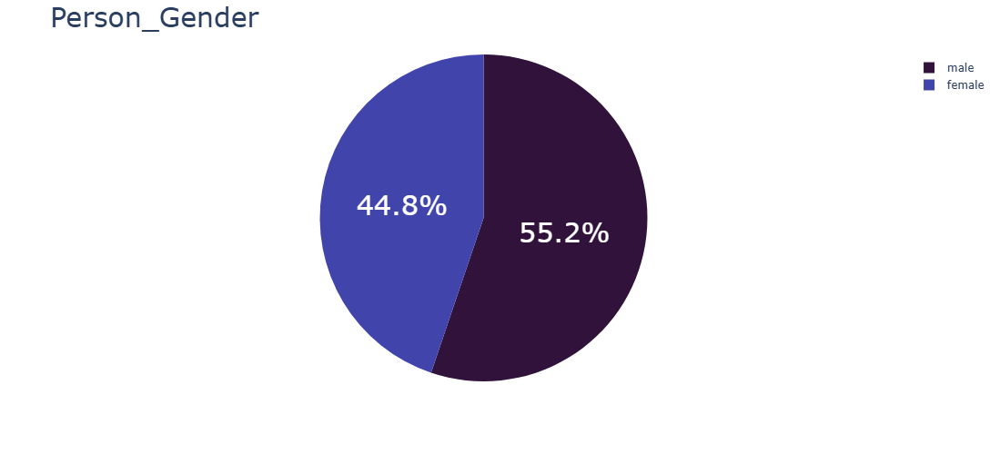

In [22]:
#Pie chart to Shows the Proportions
palette = px.colors.sequential.Turbo
fig=px.pie(data_frame=df , names='person_gender' , 
       color_discrete_sequence=palette,width=900 , height=500)
fig.update_traces(textfont_size=30,textfont_color='white')
fig.update_layout(title={'text': 'Person_Gender', 'font': {'size': 30}})
fig.show()

In [23]:
df["person_education"].unique()

array(['Master', 'High School', 'Bachelor', 'Associate', 'Doctorate'],
      dtype=object)

In [24]:
#Count for Each Category to plot Visual
df_sorted=df['person_education'].value_counts().reset_index()
df_sorted

,person_education,count
0,Bachelor,13393
1,Associate,12024
2,High School,11967
3,Master,6980
4,Doctorate,621


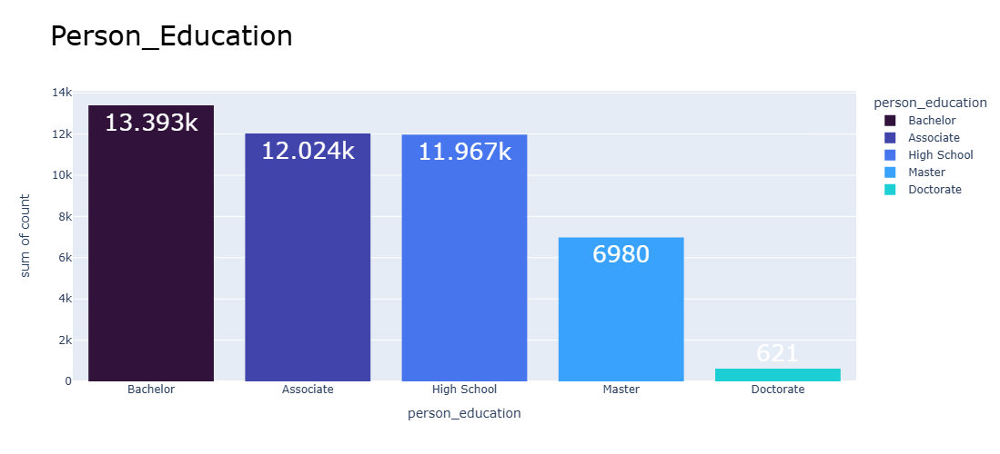

In [25]:
#Histogram that appears count for each Gender
fig=px.histogram(data_frame=df_sorted , x= 'person_education',y='count',color='person_education',color_discrete_sequence=px.colors.sequential.Turbo,
                 title= 'Person_Education',text_auto=True,width=900,height=500)
fig.update_traces(textfont_size=25,textfont_color='white')
fig.update_layout(title_font=dict(size=30, color='black')) 
fig.show()

In [26]:
df["person_income"].dtype

dtype('float64')

In [27]:
df["person_income"].describe()

count    4.498500e+04
mean     7.991017e+04
std      6.332666e+04
min      8.000000e+03
25%      4.719200e+04
50%      6.704600e+04
75%      9.578200e+04
max      2.448661e+06
Name: person_income, dtype: float64

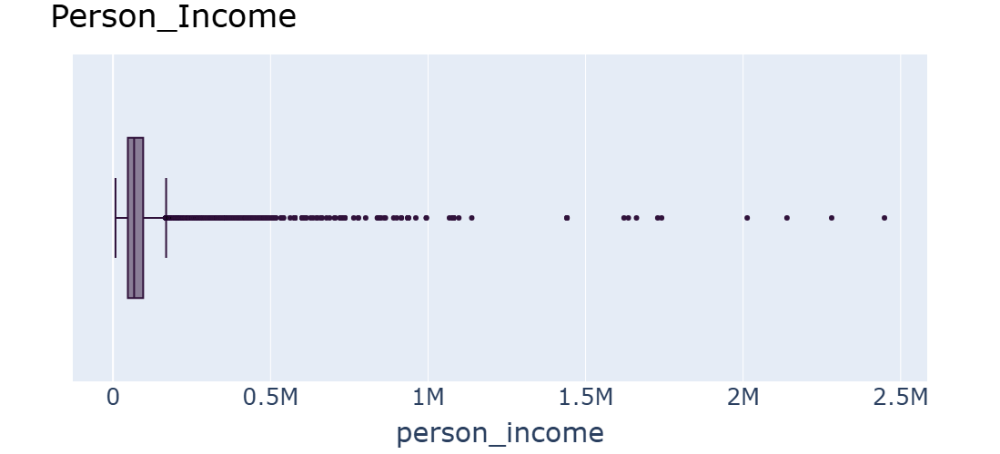

In [28]:
#Box plot to Detect outliers
fig=px.box(data_frame=df , x = 'person_income',color_discrete_sequence=px.colors.sequential.Turbo)
fig.update_layout(title="Person_Income",height=500, width=900,font=dict(size=25),
        title_font_color='black')
fig.show()

In [29]:
df["person_emp_exp"].describe()

count    44985.000000
mean         5.385351
std          5.886303
min          0.000000
25%          1.000000
50%          4.000000
75%          8.000000
max         50.000000
Name: person_emp_exp, dtype: float64

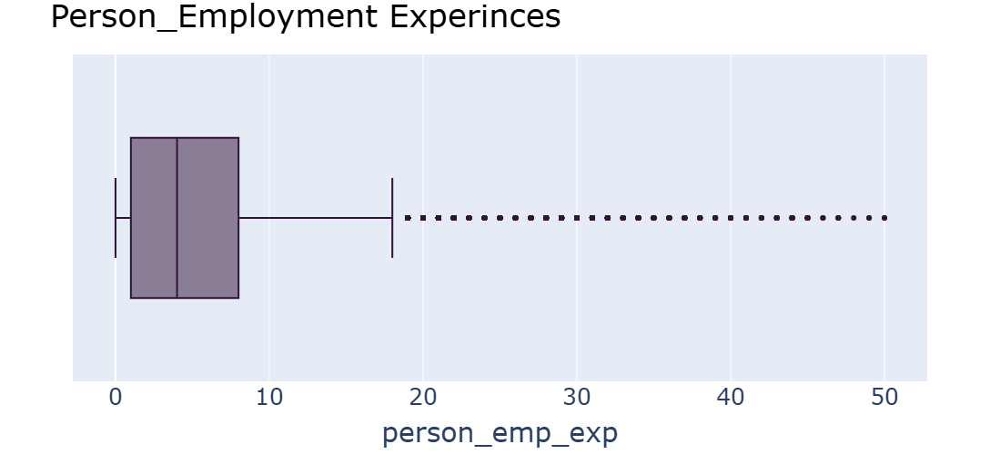

In [49]:
#Box plot to Detect outliers
fig=px.box(data_frame=df , x = 'person_emp_exp',color_discrete_sequence=px.colors.sequential.Turbo)
fig.update_layout(title="Person_Employment Experinces",height=500, width=900,font=dict(size=25),
        title_font_color='black')
fig.show()

In [51]:
df = df[df["person_age"] > df["person_emp_exp"]]

In [54]:
df["experience_age_ratio"].describe()

count    44985.000000
mean         0.167176
std          0.144751
min          0.000000
25%          0.041667
50%          0.148148
75%          0.264706
max          0.714286
Name: experience_age_ratio, dtype: float64

In [30]:
#Count for Each Category to plot Visual
df_sorted=df['person_home_ownership'].value_counts().reset_index()
df_sorted

,person_home_ownership,count
0,RENT,23434
1,MORTGAGE,18483
2,OWN,2951
3,OTHER,117


In [31]:
df["person_home_ownership"].unique()

array(['RENT', 'OWN', 'MORTGAGE', 'OTHER'], dtype=object)

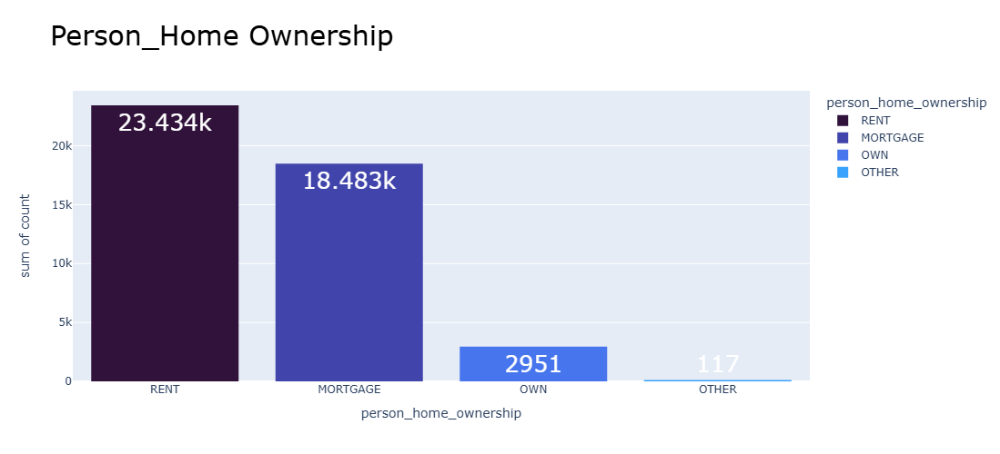

In [31]:
#Histogram that appears count for each Gender
fig=px.histogram(data_frame=df_sorted , x= 'person_home_ownership',y='count',color='person_home_ownership',color_discrete_sequence=px.colors.sequential.Turbo,
                 title= 'Person_Home Ownership',text_auto=True,width=900,height=500)
fig.update_traces(textfont_size=25,textfont_color='white')
fig.update_layout(title_font=dict(size=30, color='black')) 
fig.show()

In [32]:
df["loan_amnt"].describe()

count    44985.000000
mean      9583.638368
std       6315.056351
min        500.000000
25%       5000.000000
50%       8000.000000
75%      12238.000000
max      35000.000000
Name: loan_amnt, dtype: float64

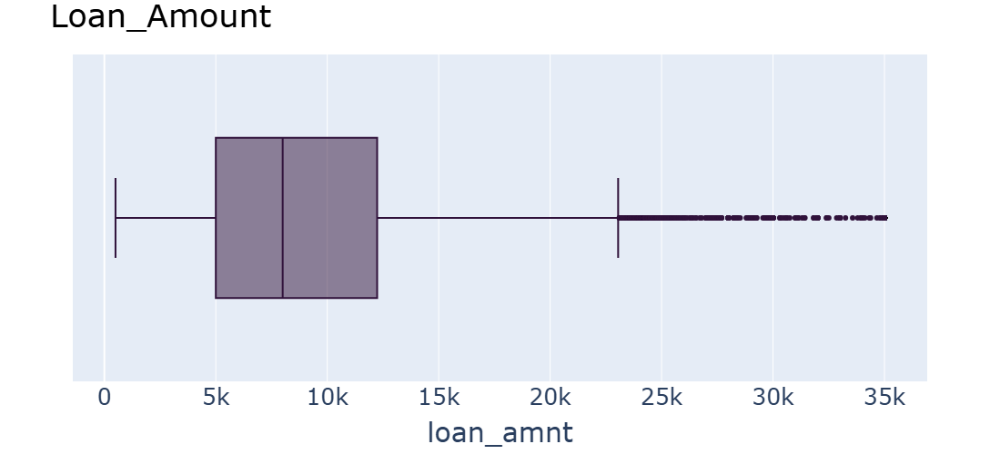

In [33]:
#Box plot to Detect outliers
fig=px.box(data_frame=df , x = 'loan_amnt',color_discrete_sequence=px.colors.sequential.Turbo)
fig.update_layout(title="Loan_Amount",height=500, width=900,font=dict(size=25),
        title_font_color='black')
fig.show()

In [34]:
df["loan_intent"].unique()

array(['PERSONAL', 'EDUCATION', 'MEDICAL', 'VENTURE', 'HOMEIMPROVEMENT',
       'DEBTCONSOLIDATION'], dtype=object)

In [35]:
#Count for Each Category to plot Visual
df_sorted=df['loan_intent'].value_counts().reset_index()
df_sorted

,loan_intent,count
0,EDUCATION,9151
1,MEDICAL,8542
2,VENTURE,7815
3,PERSONAL,7549
4,DEBTCONSOLIDATION,7145
5,HOMEIMPROVEMENT,4783


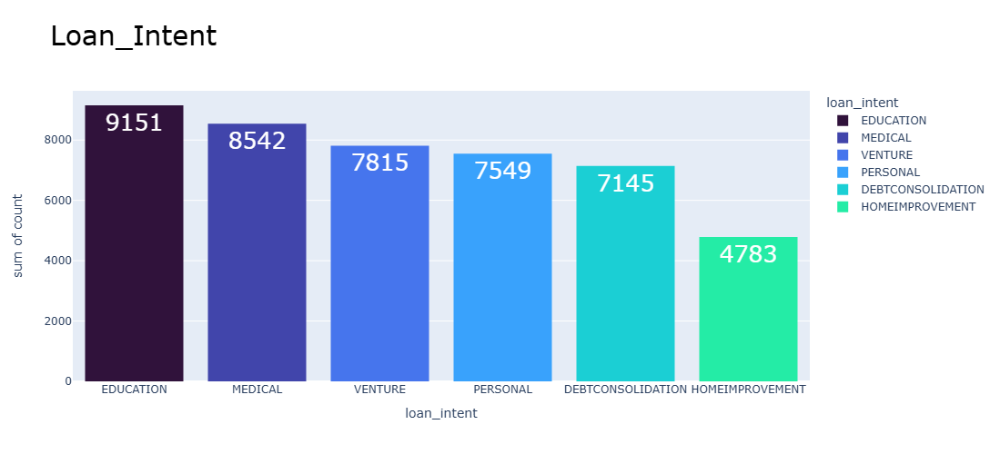

In [36]:
#Histogram that appears count for each Gender
fig=px.histogram(data_frame=df_sorted , x= 'loan_intent',y='count',color='loan_intent',color_discrete_sequence=px.colors.sequential.Turbo,
                 title= 'Loan_Intent',text_auto=True,width=900,height=500)
fig.update_traces(textfont_size=25,textfont_color='white')
fig.update_layout(title_font=dict(size=30, color='black')) 
fig.show()

In [39]:
df["loan_int_rate"].describe()

count    44993.000000
mean        11.006448
std          2.978985
min          5.420000
25%          8.590000
50%         11.010000
75%         12.990000
max         20.000000
Name: loan_int_rate, dtype: float64

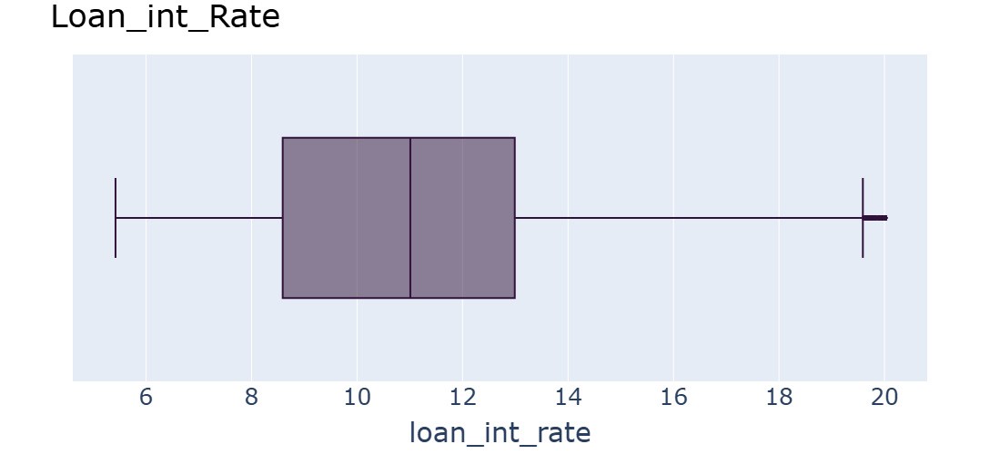

In [40]:
#Box plot to Detect outliers
fig=px.box(data_frame=df , x = 'loan_int_rate',color_discrete_sequence=px.colors.sequential.Turbo)
fig.update_layout(title="Loan_int_Rate",height=500, width=900,font=dict(size=25),
        title_font_color='black')
fig.show()

In [41]:
df["loan_percent_income"].describe()

count    44993.000000
mean         0.139736
std          0.087207
min          0.000000
25%          0.070000
50%          0.120000
75%          0.190000
max          0.660000
Name: loan_percent_income, dtype: float64

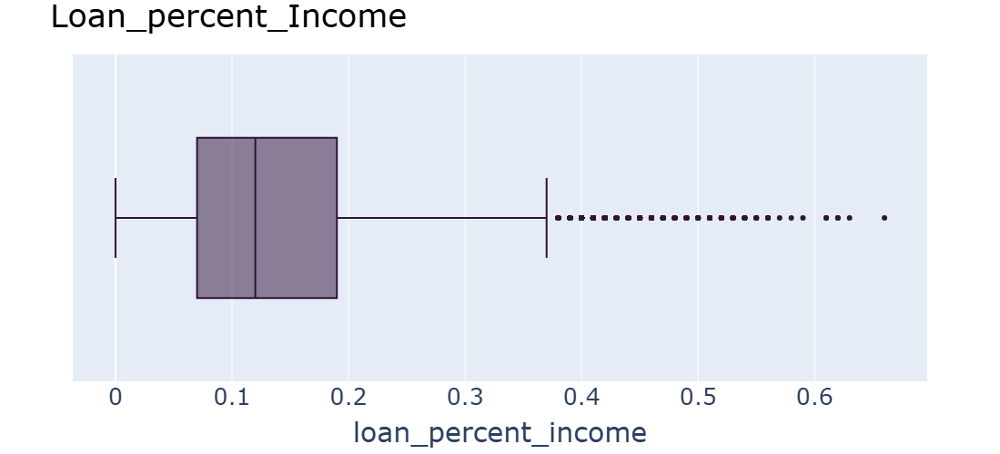

In [37]:
#Box plot to Detect outliers
fig=px.box(data_frame=df , x = 'loan_percent_income',color_discrete_sequence=px.colors.sequential.Turbo)
fig.update_layout(title="Loan_percent_Income",height=500, width=900,font=dict(size=25),
        title_font_color='black')
fig.show()

In [38]:
df["cb_person_cred_hist_length"].describe()

count    44985.000000
mean         5.863177
std          3.869127
min          2.000000
25%          3.000000
50%          4.000000
75%          8.000000
max         30.000000
Name: cb_person_cred_hist_length, dtype: float64

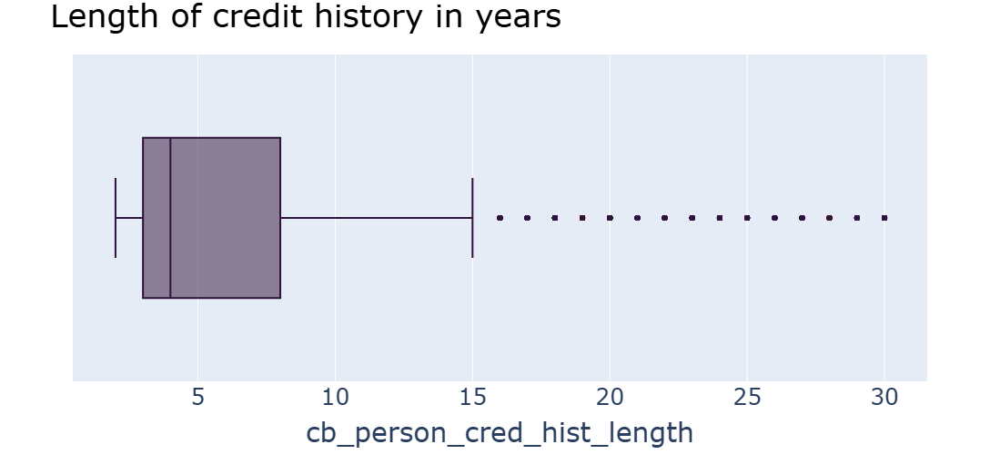

In [39]:
#Box plot to Detect outliers
fig=px.box(data_frame=df , x = 'cb_person_cred_hist_length',color_discrete_sequence=px.colors.sequential.Turbo)
fig.update_layout(title="Length of credit history in years",height=500, width=900,font=dict(size=25),
        title_font_color='black')
fig.show()

In [40]:
df["credit_score"].describe()

count    44985.000000
mean       632.569123
std         50.388810
min        390.000000
25%        601.000000
50%        640.000000
75%        670.000000
max        784.000000
Name: credit_score, dtype: float64

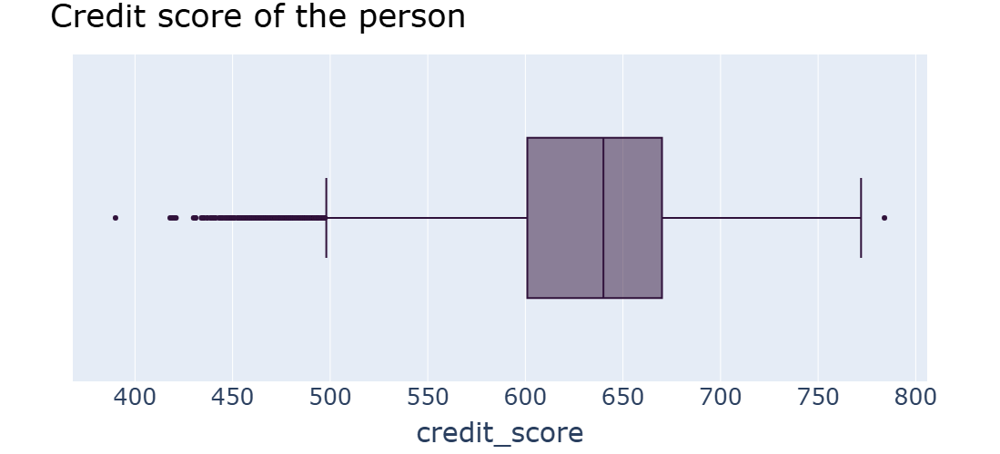

In [41]:
#Box plot to Detect outliers
fig=px.box(data_frame=df , x = 'credit_score',color_discrete_sequence=px.colors.sequential.Turbo)
fig.update_layout(title="Credit score of the person",height=500, width=900,font=dict(size=25),
        title_font_color='black')
fig.show()

In [42]:
df["previous_loan_defaults_on_file"].unique()

array(['No', 'Yes'], dtype=object)

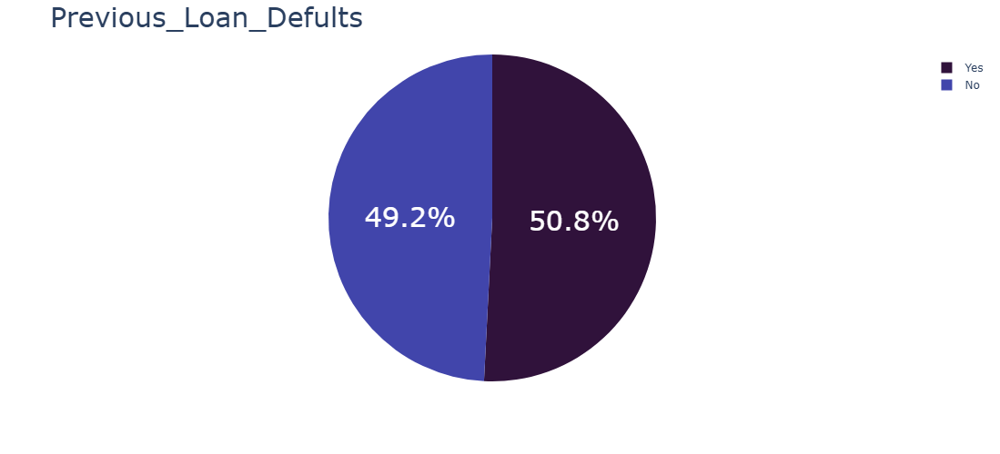

In [43]:
#Pie chart to Shows the Proportions
palette = px.colors.sequential.Turbo
fig=px.pie(data_frame=df , names='previous_loan_defaults_on_file' , 
       color_discrete_sequence=palette,width=900 , height=500)
fig.update_traces(textfont_size=30,textfont_color='white')
fig.update_layout(title={'text': 'Previous_Loan_Defults', 'font': {'size': 30}})
fig.show()

In [44]:
#Count for Each Category to plot Visual
df_sorted=df['previous_loan_defaults_on_file'].value_counts().reset_index()
df_sorted

,previous_loan_defaults_on_file,count
0,Yes,22854
1,No,22131


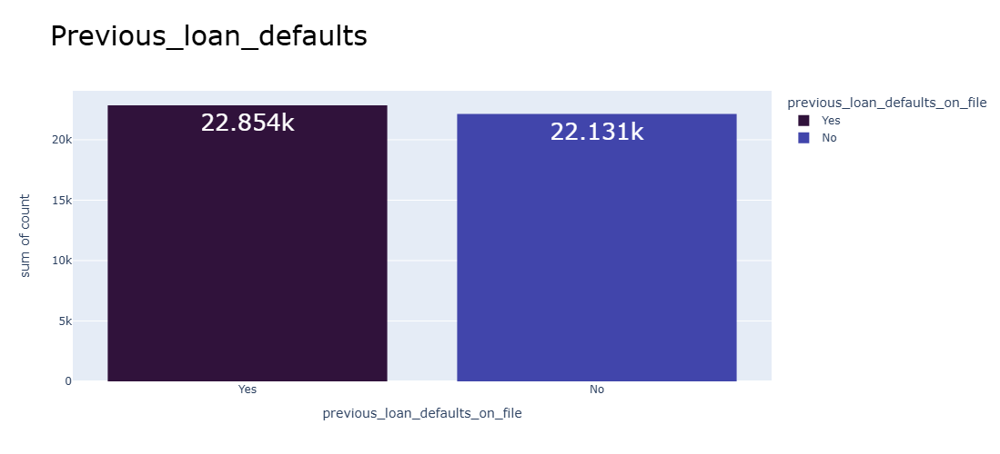

In [45]:
#Histogram that appears count for each Gender
fig=px.histogram(data_frame=df_sorted , x= 'previous_loan_defaults_on_file',y='count',color='previous_loan_defaults_on_file',color_discrete_sequence=px.colors.sequential.Turbo,
                 title= 'Previous_loan_defaults',text_auto=True,width=900,height=500)
fig.update_traces(textfont_size=25,textfont_color='white')
fig.update_layout(title_font=dict(size=30, color='black')) 
fig.show()

In [46]:
df["loan_status"].unique()

array([1, 0], dtype=int64)

In [47]:
#Count for Each Category to plot Visual
df_sorted=df['loan_status'].astype(str).value_counts().reset_index()
df_sorted

,loan_status,count
0,0,34985
1,1,10000


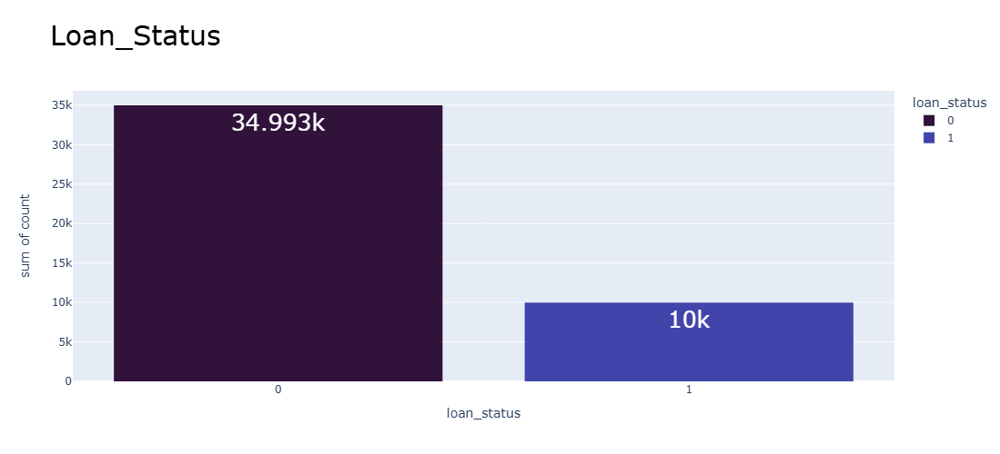

In [53]:
#Histogram that appears count for each Gender
fig=px.histogram(data_frame=df_sorted , x= 'loan_status',y='count',color='loan_status',color_discrete_sequence=px.colors.sequential.Turbo,
                 title= 'Loan_Status',text_auto=True,width=900,height=500)
fig.update_traces(textfont_size=25,textfont_color='white')
fig.update_layout(title_font=dict(size=30, color='black')) 
fig.show()

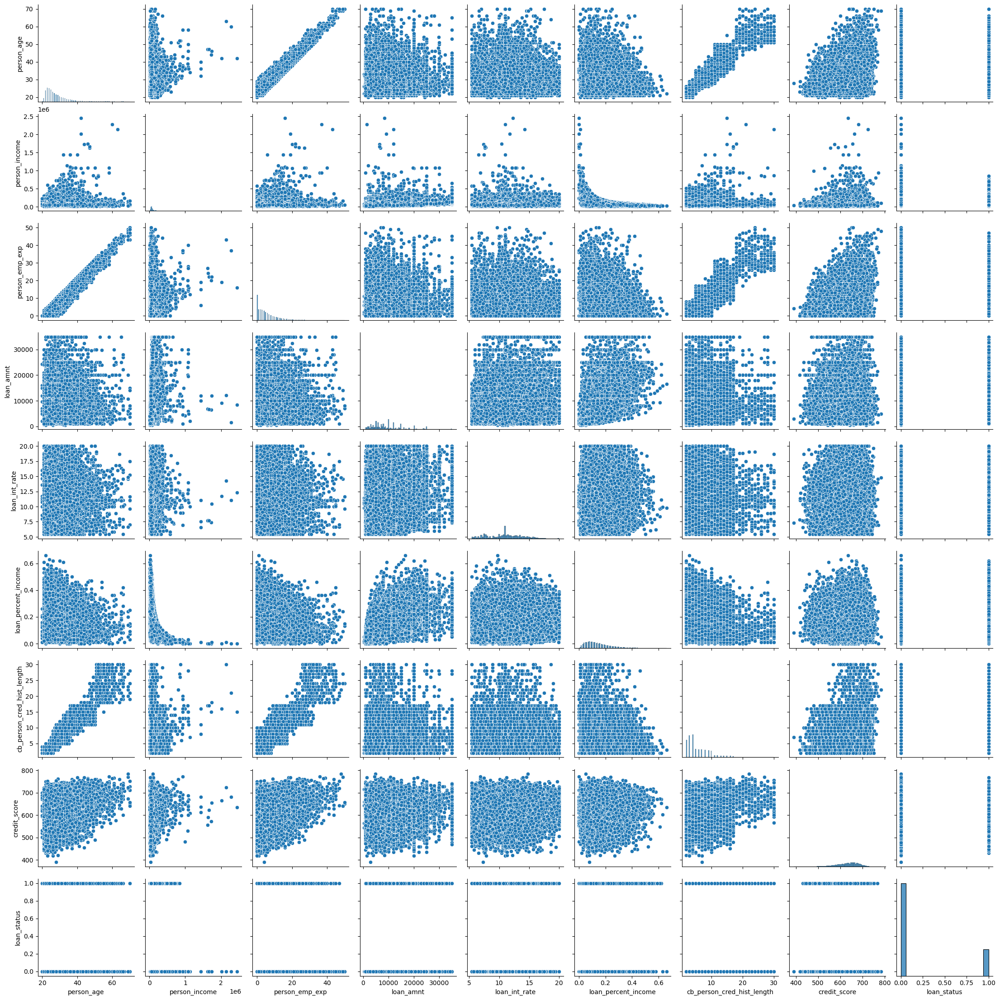

In [48]:
import matplotlib.pyplot as plt
sns.pairplot(df.select_dtypes('number'))
plt.show()

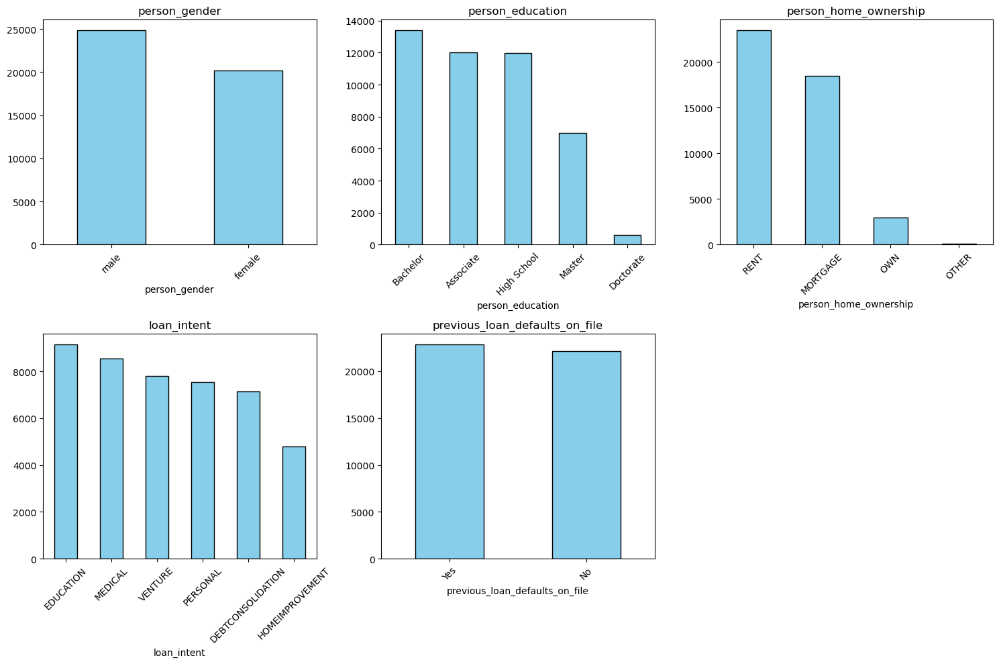

In [18]:
import matplotlib.pyplot as plt
import math
# Determine the categorical columns
categorical_columns = df.select_dtypes('O').columns

# Grid setup
n_features = len(categorical_columns)
n_cols = 3  # Number of columns per row
n_rows = math.ceil(n_features / n_cols)  # Number of rows needed

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 5))
axes = axes.flatten()  # Flatten axes for easy iteration

# Plot each categorical column
for i, column in enumerate(categorical_columns):
    counts = df[column].value_counts()
    counts.plot(kind='bar', ax=axes[i], color='skyblue', edgecolor='black')
    axes[i].set_title(f'{column}')
    axes[i].set_xticks(range(len(counts.index)))
    axes[i].set_xticklabels(counts.index, rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

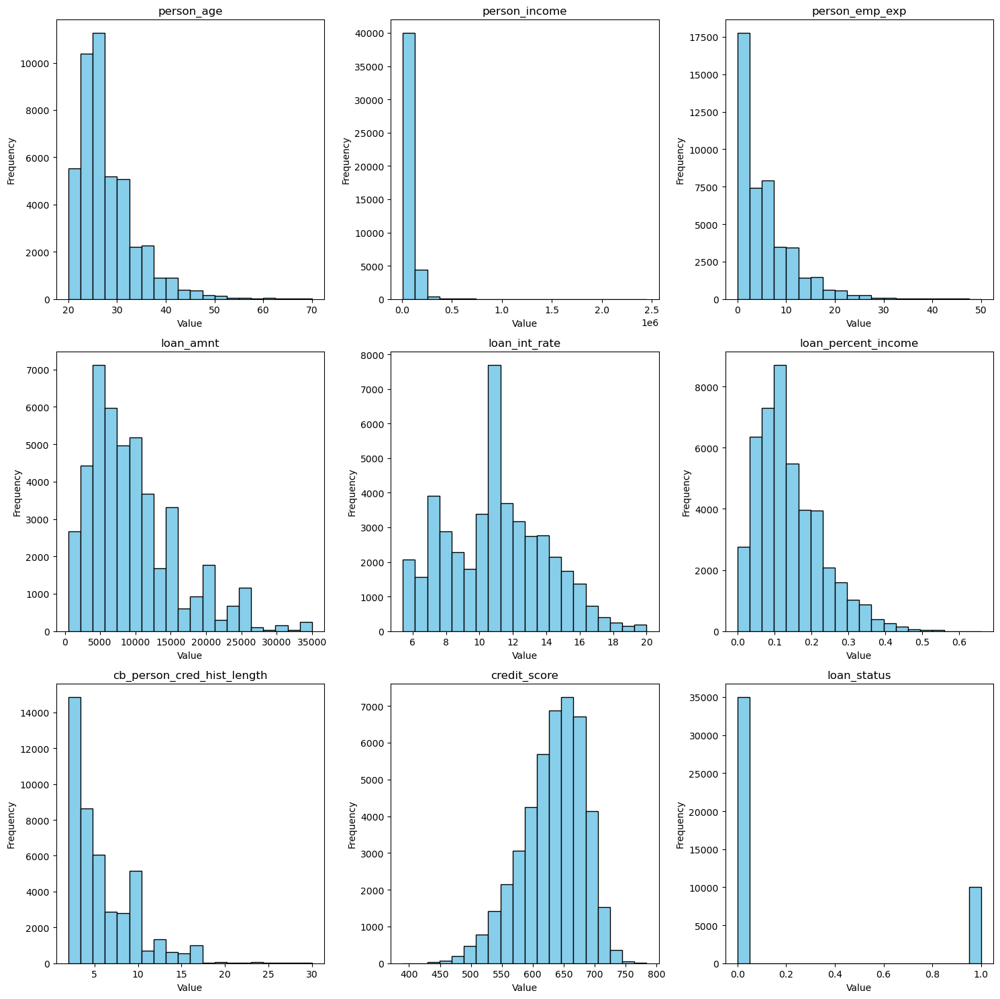

In [19]:
# Determine numeric columns
numeric_columns = df.select_dtypes('number').columns

# Grid setup
n_features = len(numeric_columns)
n_cols = 3  # Number of columns per row
n_rows = math.ceil(n_features / n_cols)  # Number of rows needed

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 5))
axes = axes.flatten()  # Flatten axes for easy iteration

# Plot each numeric column
for i, column in enumerate(numeric_columns):
    df[column].plot(kind='hist', bins=20, ax=axes[i], color='skyblue', edgecolor='black')
    axes[i].set_title(f'{column}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()